In [1]:
#import all library required
import numpy as np
import pandas as pd
import tensorflow as tf
from keras import backend as K
from pathlib import Path
import matplotlib as mpl
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

mpl.style.use("seaborn-darkgrid")
#import all keras library component 
from tensorflow.keras.layers import (
    Input,
    Conv2D, 
    MaxPool2D, 
    Dense, 
    BatchNormalization, 
    ReLU, 
    Dropout, 
    Flatten,
    Dropout,
    Concatenate,
    GlobalAvgPool2D
)

from tensorflow.keras.regularizers import L2

In [2]:
from google.colab import files
files.upload()

Saving below_img_enrich.zip to below_img_enrich.zip


{'below_img_enrich.zip': b'PK\x03\x04\x14\x00\x00\x00\x08\x00\x98\x8e\x97U\x13\x07\xad8\xc5/K\x00O\xf0(\x01\x14\x00\x00\x00below_img_enrich.csv\xec\\\xcb\x8e+;\x8e\xdc\x0f0\x7f\xe2\x85^\xa4\xa4\xf5\xfc\xce\x00\xfd\xff\xbb\x11\xc9\xa0\xc4\xcc\xe3\xba\xb7n\xf7n \xe0\xf0\xd8Ue\xa7\x95!>\x82\x0f\xf9\x7f\xfe\xf5\xbf\x9f+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xca\x95+W\xae\\\xb9r\xe5\xff\xb9\xfc\xf7\x7f\x95\xd2?&\xe3s\x9e\xc7\xdf\xbde\xfe,5\xadG\xfa\x94\xbc^\x97\xeb\x92\xa2\xcf\xf3\\\xc2\xf5\x93+}rI\xebqI\x91\xe7m=\xef\x9f\x9c\xdbg\xca\x83\xfcz\xea\x8f9\xf3\'\xb7%\xbd\xac\xb7\xae\xbf\xf5\xf6)i\xfd^^7\xd7\xa5\xe6\xfa\xdb\

In [3]:
from google.colab import files
files.upload()

Saving mat_duoi_enrich_pt.csv to mat_duoi_enrich_pt.csv


{'mat_duoi_enrich_pt.csv': b'6x,6y,7x,7y,8x,8y,9x,9y,10x,10y,11x,11y,12x,12y,13x,13y,14x,14y\r\n55,28,48,31,55,34,63,32,67,36,63,41,55,39,47,40,42,36\r\n48,38,41,42,48,44,56,43,60,47,58,50,48,48,41,50,37,47\r\n45,25,35,33,45,35,57,33,60,37,58,42,46,40,35,43,31,39\r\n43,5,36,9,43,11,50,10,52,14,49,18,43,16,37,17,33,14\r\n55,3,46,8,55,10,64,8,68,12,65,16,55,13,46,16,43,12\r\n50,24,40,35,51,36,62,34,64,39,63,45,50,43,39,45,36,41\r\n46,33,34,40,46,42,61,40,65,45,62,51,46,48,33,51,29,46\r\n53,42,42,49,54,52,65,49,70,55,66,62,54,58,42,61,37,56\r\n46,36,35,42,46,44,58,42,61,47,60,53,46,50,36,52,32,48\r\n47,37,37,45,48,46,57,44,60,48,58,53,48,50,39,53,35,50\r\n44,27,36,32,45,35,54,32,58,37,55,42,45,40,35,43,32,38\r\n57,34,45,42,58,44,70,41,76,48,72,54,58,50,44,54,40,48\r\n47,38,39,42,48,44,57,42,62,46,59,51,48,49,40,51,35,48\r\n50,37,38,45,51,47,64,45,68,49,65,56,51,54,37,57,33,51\r\n47,8,39,13,47,14,53,13,56,17,55,21,47,18,38,21,37,17\r\n50,4,43,10,50,11,58,10,60,13,59,17,50,14,43,17,40,14\r\

In [4]:
#read train data, and analysis
# df_train=pd.read_csv("train.csv")
df_train=pd.read_csv("mat_duoi_enrich_pt.csv")

In [5]:
#read img data, and analysis
# df_img=pd.read_csv("Img.zip")
df_img=pd.read_csv("below_img_enrich.zip")
print(df_img)

     Col  Col.1  Col.2  Col.3  Col.4  Col.5  Col.6  Col.7  Col.8  Col.9  ...  \
0    227    227    228    227    227    227    227    228    228    228  ...   
1    237    237    237    237    237    237    237    237    237    238  ...   
2    111    110     76     55     48     32     20     20     27     35  ...   
3    207    208    208    208    208    207    208    208    209    208  ...   
4    217    217    217    217    217    216    217    218    218    218  ...   
..   ...    ...    ...    ...    ...    ...    ...    ...    ...    ...  ...   
559   38     26     34     58     77    106    132    142    144    142  ...   
560  252    252    252    252    252    252    252    252    252    252  ...   
561  146    163    152    116     91    105     97    112     79     90  ...   
562  244    244    245    246    245    243    244    246    245    242  ...   
563  238    235    234    236    238    235    233    237    235    238  ...   

     Col.9206  Col.9207  Col.9208  Col.

In [6]:
print(df_train)

     6x  6y  7x  7y  8x  8y  9x  9y  10x  10y  11x  11y  12x  12y  13x  13y  \
0    55  28  48  31  55  34  63  32   67   36   63   41   55   39   47   40   
1    48  38  41  42  48  44  56  43   60   47   58   50   48   48   41   50   
2    45  25  35  33  45  35  57  33   60   37   58   42   46   40   35   43   
3    43   5  36   9  43  11  50  10   52   14   49   18   43   16   37   17   
4    55   3  46   8  55  10  64   8   68   12   65   16   55   13   46   16   
..   ..  ..  ..  ..  ..  ..  ..  ..  ...  ...  ...  ...  ...  ...  ...  ...   
559  46   1  34  14  46  16  61  16   64   28   63   39   46   31   32   35   
560  47  15  39  24  48  24  58  24   60   27   61   32   48   29   35   34   
561  51  22  40  34  53  35  66  31   68   37   66   44   53   41   42   45   
562  46  18  36  24  46  25  57  25   59   30   58   37   46   31   36   36   
563  49  25  42  30  48  32  56  32   59   36   58   41   48   37   40   40   

     14x  14y  
0     42   36  
1     37   47  
2  

In [7]:
df_img['Image'] = df_img[df_img.columns[0:]].apply(lambda x: ' '.join(x.dropna().astype(str)),axis=1)
print("Modified DataFrame:\n",df_img["Image"])
print(df_img.head())

Modified DataFrame:
 0      227 227 228 227 227 227 227 228 228 228 228 22...
1      237 237 237 237 237 237 237 237 237 238 238 23...
2      111 110 76 55 48 32 20 20 27 35 38 38 34 35 46...
3      207 208 208 208 208 207 208 208 209 208 209 20...
4      217 217 217 217 217 216 217 218 218 218 218 21...
                             ...                        
559    38 26 34 58 77 106 132 142 144 142 144 136 113...
560    252 252 252 252 252 252 252 252 252 252 252 25...
561    146 163 152 116 91 105 97 112 79 90 100 118 10...
562    244 244 245 246 245 243 244 246 245 242 244 24...
563    238 235 234 236 238 235 233 237 235 238 237 23...
Name: Image, Length: 564, dtype: object
   Col  Col.1  Col.2  Col.3  Col.4  Col.5  Col.6  Col.7  Col.8  Col.9  ...  \
0  227    227    228    227    227    227    227    228    228    228  ...   
1  237    237    237    237    237    237    237    237    237    238  ...   
2  111    110     76     55     48     32     20     20     27     35  ...   


In [8]:
df_img.head(1)

,Col,Col.1,Col.2,Col.3,Col.4,Col.5,Col.6,Col.7,Col.8,Col.9,...,Col.9207,Col.9208,Col.9209,Col.9210,Col.9211,Col.9212,Col.9213,Col.9214,Col.9215,Image
0,227,227,228,227,227,227,227,228,228,228,...,217,218,217,217,217,217,217,216,216,227 227 228 227 227 227 227 228 228 228 228 22...


In [ ]:
# images=np.array(df_img['Image'].str.split().tolist(), dtype="float").reshape(-1,96,96,1)
# print(images)

In [9]:
df_train.head(3)
#dataset consist of 30 feature (x and y coordinate ) and image array

,6x,6y,7x,7y,8x,8y,9x,9y,10x,10y,11x,11y,12x,12y,13x,13y,14x,14y
0,55,28,48,31,55,34,63,32,67,36,63,41,55,39,47,40,42,36
1,48,38,41,42,48,44,56,43,60,47,58,50,48,48,41,50,37,47
2,45,25,35,33,45,35,57,33,60,37,58,42,46,40,35,43,31,39


In [10]:
# define feature and target columns
# 
# feature_col,target_col="Image",list(df_train.drop("Image",axis=1).columns)
feature_col,target_col="Image",list(df_train.columns)

In [11]:
# replace NaN with mean  
# if found Nan replace
# df_train[target_col] = df_train[target_col].fillna(df_train[target_col].mean())
df_train.info()
print(df_train)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564 entries, 0 to 563
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   6x      564 non-null    int64
 1   6y      564 non-null    int64
 2   7x      564 non-null    int64
 3   7y      564 non-null    int64
 4   8x      564 non-null    int64
 5   8y      564 non-null    int64
 6   9x      564 non-null    int64
 7   9y      564 non-null    int64
 8   10x     564 non-null    int64
 9   10y     564 non-null    int64
 10  11x     564 non-null    int64
 11  11y     564 non-null    int64
 12  12x     564 non-null    int64
 13  12y     564 non-null    int64
 14  13x     564 non-null    int64
 15  13y     564 non-null    int64
 16  14x     564 non-null    int64
 17  14y     564 non-null    int64
dtypes: int64(18)
memory usage: 79.4 KB
     6x  6y  7x  7y  8x  8y  9x  9y  10x  10y  11x  11y  12x  12y  13x  13y  \
0    55  28  48  31  55  34  63  32   67   36   63   41   55   39   47   40 

In [ ]:
target_col # total 30 target (x,y coordinate)

['6x',
 '6y',
 '7x',
 '7y',
 '8x',
 '8y',
 '9x',
 '9y',
 '10x',
 '10y',
 '11x',
 '11y',
 '12x',
 '12y',
 '13x',
 '13y',
 '14x',
 '14y']

In [12]:
# define width and height of image
IMG_WIDTH=96
IMG_HEIGHT=96
IMG_CANNELS=1 # grayscale image
## split image and label  #image
images=np.array(df_img[feature_col].str.split().tolist(),dtype="float").reshape(-1,IMG_HEIGHT,IMG_WIDTH,IMG_CANNELS)
print(images)
labels=df_train[target_col].to_numpy()

[[[[227.]
   [227.]
   [228.]
   ...
   [230.]
   [229.]
   [229.]]

  [[227.]
   [227.]
   [227.]
   ...
   [229.]
   [229.]
   [229.]]

  [[227.]
   [227.]
   [228.]
   ...
   [229.]
   [229.]
   [229.]]

  ...

  [[217.]
   [216.]
   [217.]
   ...
   [217.]
   [217.]
   [216.]]

  [[217.]
   [217.]
   [216.]
   ...
   [217.]
   [216.]
   [216.]]

  [[215.]
   [212.]
   [212.]
   ...
   [217.]
   [216.]
   [216.]]]


 [[[237.]
   [237.]
   [237.]
   ...
   [234.]
   [234.]
   [234.]]

  [[237.]
   [237.]
   [237.]
   ...
   [234.]
   [234.]
   [234.]]

  [[237.]
   [237.]
   [237.]
   ...
   [235.]
   [234.]
   [234.]]

  ...

  [[225.]
   [225.]
   [225.]
   ...
   [218.]
   [222.]
   [224.]]

  [[224.]
   [224.]
   [224.]
   ...
   [218.]
   [222.]
   [224.]]

  [[224.]
   [224.]
   [224.]
   ...
   [218.]
   [222.]
   [223.]]]


 [[[111.]
   [110.]
   [ 76.]
   ...
   [170.]
   [174.]
   [178.]]

  [[124.]
   [ 75.]
   [ 48.]
   ...
   [165.]
   [170.]
   [174.]]

  [[102.]
   [ 4

In [13]:
print(images[0].shape)
# scale image from 0 -255 to 0-1 for better training
scaled_images=images/255.0

(96, 96, 1)


In [14]:
print(labels)
print(labels.shape)

[[55 28 48 ... 40 42 36]
 [48 38 41 ... 50 37 47]
 [45 25 35 ... 43 31 39]
 ...
 [51 22 40 ... 45 39 40]
 [46 18 36 ... 36 32 31]
 [49 25 42 ... 40 37 35]]
(564, 18)


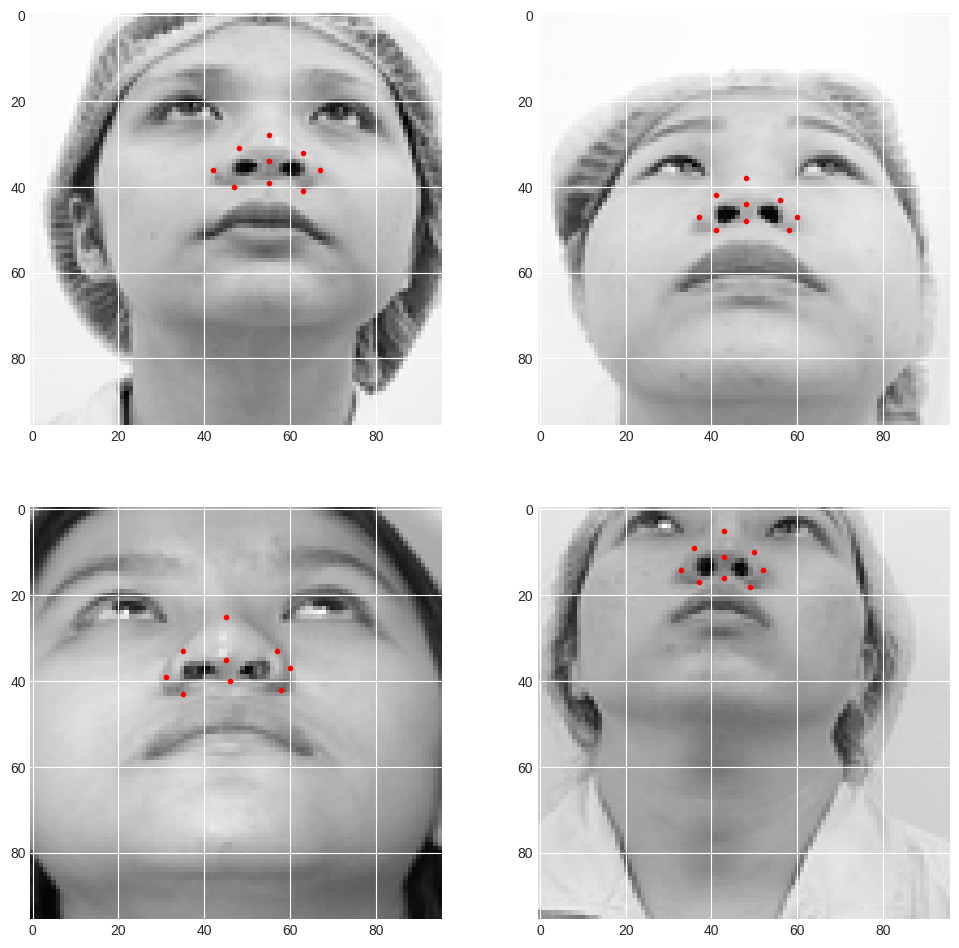

In [20]:
# Show img and key points. SHOW multil imgage
# df_train=pd.read_csv("train.csv")
# df_train=pd.read_csv("mat_truoc.csv")
df_train.head()
fig, ax = plt.subplots(2,2,figsize = (12,12), dpi = 100)
axes = ax.ravel()
for idx,ax  in enumerate(axes):
    ax.imshow(images[idx].reshape(96,96),cmap='gray')
    photo_visualize_pnts = df_train.iloc[idx].values
    ax.scatter(photo_visualize_pnts[0::2], photo_visualize_pnts[1::2],c='Red', marker='.')
fig.show()


In [21]:
# spliting training dataset for training, test and validation
train_images,valid_images,train_labels,valid_labels=train_test_split(scaled_images,labels,test_size=0.1,random_state=7)
train_images,test_images,train_labels,test_labels=train_test_split(train_images,train_labels,test_size=0.1,random_state=7)



In [22]:
print(" số lượng train img là: ", train_images.shape)
print(" số lượng test img là: ",test_images.shape)
print(" số lượng valid là: ",valid_images.shape)

 số lượng train img là:  (456, 96, 96, 1)
 số lượng test img là:  (51, 96, 96, 1)
 số lượng valid là:  (57, 96, 96, 1)


In [23]:
# Let's start with model
# We will create CNN model that uses Inception Architecture
def inception_module(inputs,f1,f2):
    # defining convolution 2d layer 
    x1=Conv2D(f1,3,padding="same")(inputs)
    # batchnormalize the x1
    x1=BatchNormalization()(x1)
    x1=ReLU()(x1)   
    # it was f1 change it to f2 
    x2=Conv2D(f2,5,padding="same")(inputs)
    # batchnormalize the x1
    x2=BatchNormalization()(x2)
    x2=ReLU()(x2)
    # combine x1 and x2
    return Concatenate()([x1,x2])
    

In [24]:
def build_model():
    inputs = Input((96, 96, 1))
    x = inception_module(inputs, 64,  32)
    x = MaxPool2D()(x)
    x = inception_module(x, 64,  32)
    x = MaxPool2D()(x)
    x = inception_module(x, 128, 32)
    x = MaxPool2D()(x)
    x = inception_module(x, 128, 32)
    x = MaxPool2D()(x)
    x = inception_module(x, 256, 64)
    x = MaxPool2D()(x)
    x = Flatten()(x)
    x = Dense(1024, kernel_regularizer=L2(l2=0.05))(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Dense(512, kernel_regularizer=L2(l2=0.02))(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Dense(128, kernel_regularizer=L2(l2=0.01))(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    ## train wwith 9 points
    x = Dense(18)(x)
    
    model = tf.keras.Model(inputs, outputs=x)
    return model

model = build_model()
# model.summary()
from keras.utils.vis_utils import plot_model
# plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [25]:
#compile model 
# def custom_mean_squared_error(y_true, y_pred):
#     return tf.math.reduce_mean(tf.sqrt.square(y_true - y_pred))
# you can change this value to get better accuracy
model.compile(optimizer="adam",loss="mean_squared_error",metrics=["mae"])

In [26]:
# creating a chechpoint to save model at best accuarcy
ckp_path="trained_model/model"
model_checkpoint=tf.keras.callbacks.ModelCheckpoint(filepath=ckp_path,
                                                   monitor="val_mae",
                                                   mode="auto",
                                                   save_best_only=True,
                                                   save_weights_only=True)

In [27]:
# create a lr reducer which decrease learning rate when accuarcy does not increase
reduce_lr=tf.keras.callbacks.ReduceLROnPlateau(factor=0.9,monitor="val_mae",
                                             mode="auto",cooldown=0,
                                             patience=10,verbose=1,min_lr=1e-10)
# patience : wait till 5 epoch
# verbose : show accuracy every 1 epoch
# min_lr=minimum learning rate
#

In [28]:
print(train_labels)
print(train_labels.shape)

[[46 39 35 ... 58 32 53]
 [45 31 34 ... 46 32 42]
 [49 25 42 ... 40 37 35]
 ...
 [50 21 40 ... 36 36 32]
 [62 15 54 ... 28 49 25]
 [52 34 38 ... 56 32 52]]
(456, 18)


In [29]:
# Training model
EPOCHS= 700
BATCH_SIZE= 20
history=model.fit(train_images,
                 train_labels,
                 validation_data=(valid_images,valid_labels),
                 batch_size=BATCH_SIZE,
                 epochs=EPOCHS,
                 callbacks=[model_checkpoint,reduce_lr]
                 )
# found the error
# we are getting NaN value in training because there is NaN in train set

Epoch 1/700
23/23 [==============================] - 13s 89ms/step - loss: 2048.8086 - mae: 42.3286 - val_loss: 2133.1970 - val_mae: 43.3513 - lr: 0.0010
Epoch 2/700
23/23 [==============================] - 1s 46ms/step - loss: 1918.1425 - mae: 40.9757 - val_loss: 2061.1033 - val_mae: 42.7221 - lr: 0.0010
Epoch 3/700
23/23 [==============================] - 1s 34ms/step - loss: 1766.5469 - mae: 39.3115 - val_loss: 2051.0359 - val_mae: 42.7382 - lr: 0.0010
Epoch 4/700
23/23 [==============================] - 1s 43ms/step - loss: 1598.5557 - mae: 37.2945 - val_loss: 2010.7133 - val_mae: 42.3729 - lr: 0.0010
Epoch 5/700
23/23 [==============================] - 1s 44ms/step - loss: 1422.9938 - mae: 35.0602 - val_loss: 1820.7355 - val_mae: 40.2440 - lr: 0.0010
Epoch 6/700
23/23 [==============================] - 1s 45ms/step - loss: 1259.0627 - mae: 32.7298 - val_loss: 1617.8074 - val_mae: 37.7809 - lr: 0.0010
Epoch 7/700
23/23 [==============================] - 1s 46ms/step - loss: 1082.81

In [ ]:
# now  training is working properly

In [ ]:
# I will see you when training is finish

In [30]:
#now the training is finished load best model from check point
model.load_weights(ckp_path)

In [31]:
# now save the model in tflite formate
#converter that convert tf to tflite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()
# Save the model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

In [32]:
# predict on test data
prediction_test_img=model.predict(test_images,batch_size=2)

26/26 [==============================] - 1s 10ms/step


In [33]:

print(prediction_test_img.shape)

(51, 18)


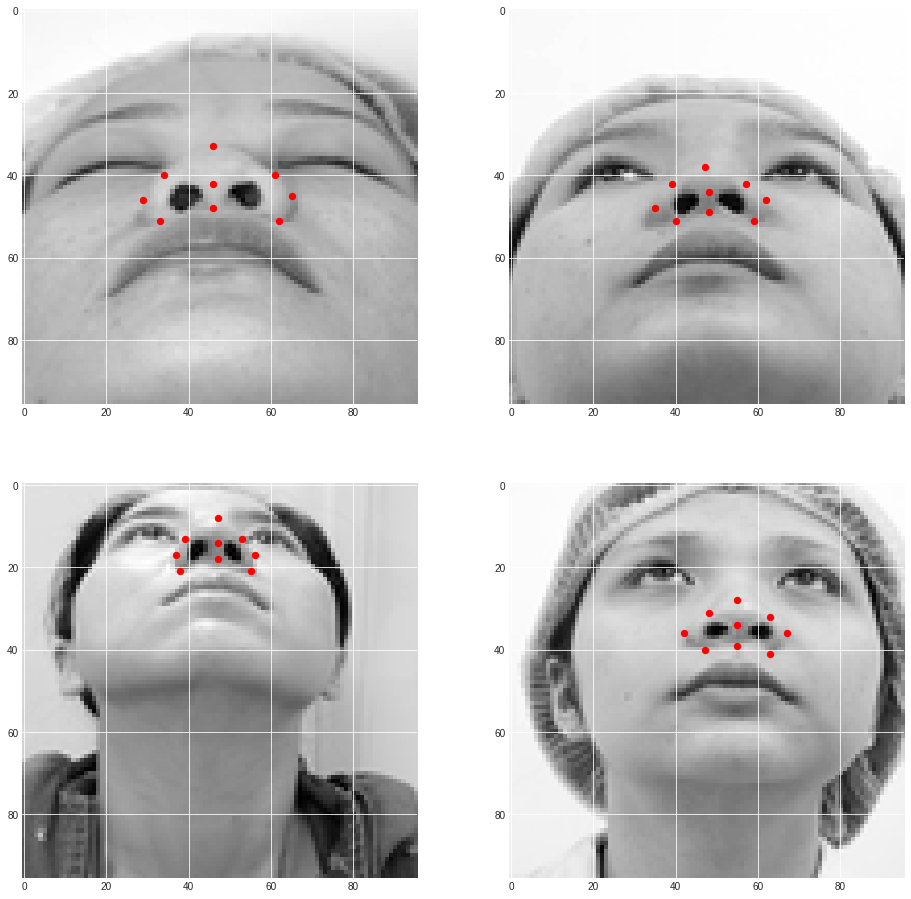

In [38]:
# let's make a function to show training dataset visual
def show_examples(images, landmarks):
  # make a figure consist of 16 images
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 16))
    # looping through each image
    for img, marks, ax in zip(images, landmarks, axes.ravel()):
        # Keypoints
        # every odd values are x coordinate
        # every even values are y coodinate
        x_points = marks[:: 2]
        y_points = marks[1::2]
        
        # display on figure 
        ax.imshow(img.squeeze(), cmap='gray')
        ax.scatter(x_points, y_points, s=40, color='red')
    
    plt.show()
    

idx = np.random.choice(16, 16)
show_examples(images[idx], labels[idx])

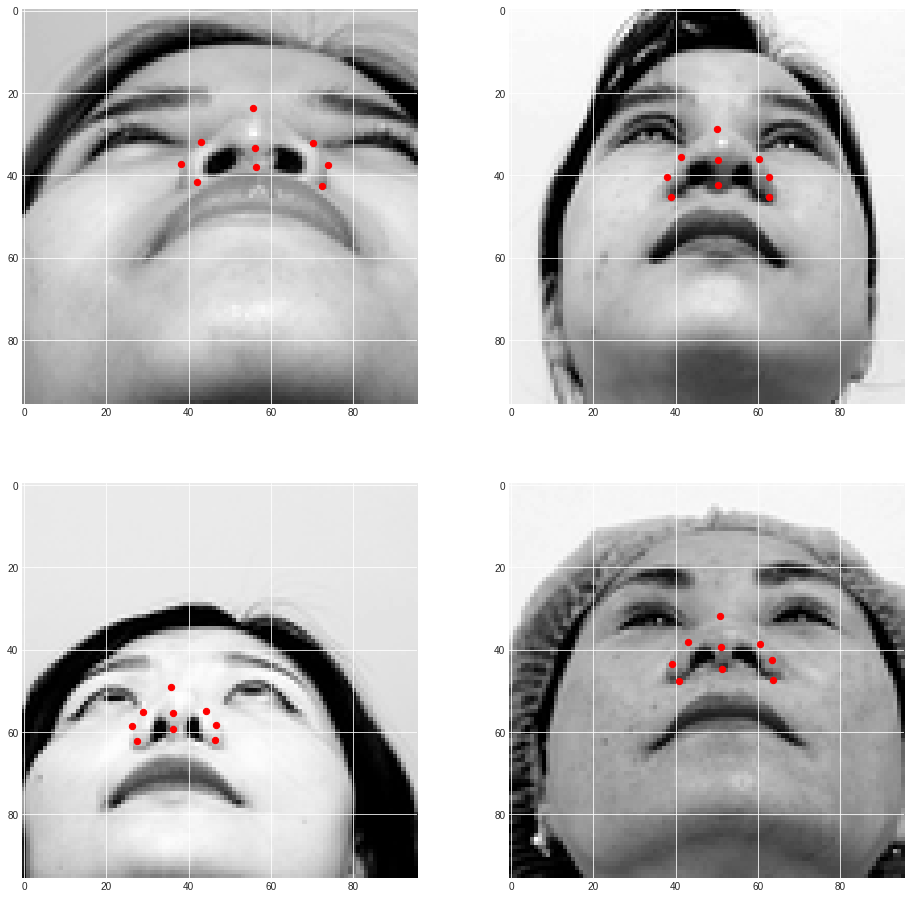

In [43]:
# Visualize test img spit from train data before train
idx=np.random.choice(16,16)
show_examples(test_images[idx]*255,prediction_test_img[idx])

In [ ]:
# perfect 
# now download model 
# or you can save version for future use
# download model after creating save is done 


In [ ]:
#Link of model and training will be in description 
# you can copy code from that link 
#